<a href="https://colab.research.google.com/github/TEhyeok/AIFFEL_Exploration/blob/main/tf_flowers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
import tensorflow_datasets as tfds

In [3]:
print(tf.__version__)

2.14.0


# Step 1. 데이터셋 내려받기

In [4]:
import pathlib
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
archive = tf.keras.utils.get_file(origin=dataset_url, extract=True)
data_dir = pathlib.Path(archive).with_suffix('')

228813984/228813984 [==============================] - 1s 0us/step


In [5]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

3670


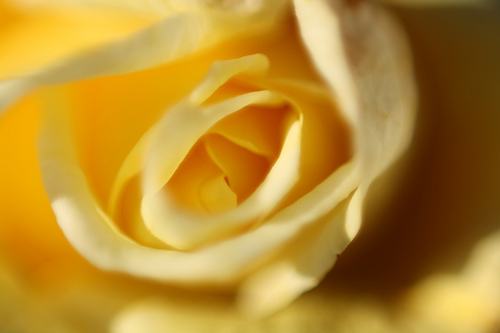

In [6]:
roses = list(data_dir.glob('roses/*'))
PIL.Image.open(str(roses[0]))

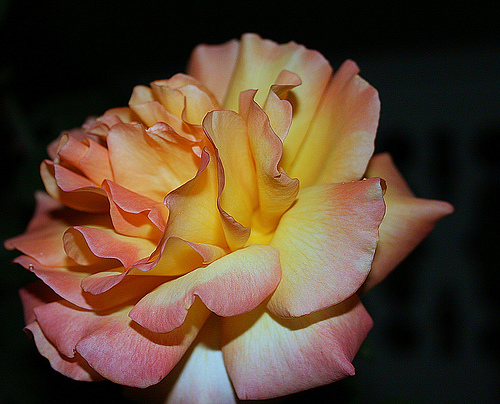

In [7]:
roses = list(data_dir.glob('roses/*'))
PIL.Image.open(str(roses[1]))

# Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기
이미지를 모두 같은 크기로 formatting 한 후, train_batches, validation_batches, test_batches를 준비합니다.


In [8]:
import tensorflow as tf
import tensorflow_datasets as tfds

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)


Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


In [9]:
print(raw_train)
print(raw_validation)
print(raw_test)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


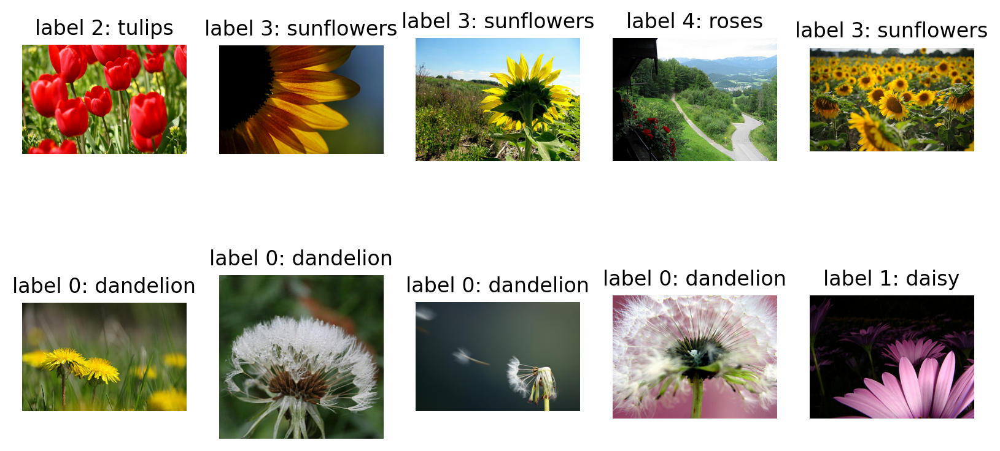

In [10]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [11]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("슝~")

슝~


In [12]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


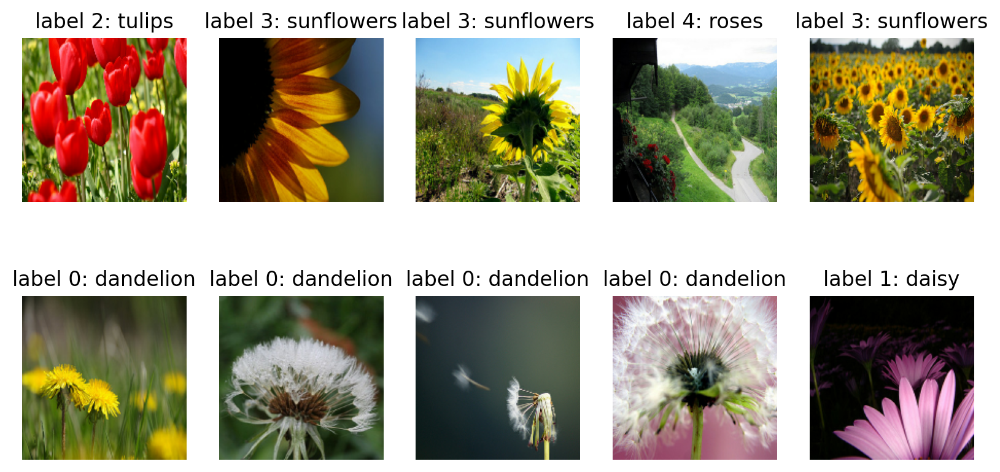

In [13]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# Step 3. 모델 설계하기!

Transfer Learning을 하기 위해 기존에 학습된 모델인 'VGG16'을 사용할 것이다.

또한 drop out layer를 만들고 0.5로 설정하여 과적합을 줄이고자 하였다.

In [123]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                                  include_top=False,
                                                  weights='imagenet')

In [124]:
feature_batch = base_model(image_batch)

In [125]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

In [126]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [127]:
feature_batch_average = global_average_layer(feature_batch)
feature_batch_average.shape

TensorShape([32, 512])

In [183]:
# dense layer에는 unit과 activation 2개의 매개변수만 사용해주세요.
# unit의 값은 위에서 global_average_layer를 통과했을 때의 값을 생각해보세요.
# 활성화 함수는 ReLU를 사용합니다.
dense_layer = tf.keras.layers.Dense(units=512, activation='relu')
dropout_layer = tf.keras.layers.Dropout(0.5)  # Dropout 층 추가
prediction_layer = tf.keras.layers.Dense(units=5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 5)


In [184]:
base_model.trainable = False
print("슝~")

슝~


# Step 4. 모델 학습시키기

모델을 학습하는 과정에서 learning_rates = 0.0012로 설정하는 것이 가장 정확도가 높은 test_accuracy 값을 가졌다.


In [215]:
import tensorflow as tf

EPOCHS = 10
learning_rates = [0.0012]
best_accuracy = 0
best_lr = None
best_model = None

for lr in learning_rates:
    model = tf.keras.Sequential([
        base_model,
        global_average_layer,
        dense_layer,
        dropout_layer,
        prediction_layer
    ])

    model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=lr),
                  loss=tf.keras.losses.sparse_categorical_crossentropy,
                  metrics=['accuracy'])

    history = model.fit(train_batches, epochs=EPOCHS, validation_data=validation_batches)

    loss, accuracy = model.evaluate(test_batches)
    print(f"Learning Rate: {lr}, Test Accuracy: {accuracy}")

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_lr = lr
        best_model = model  # 현재 모델 저장

# 가장 좋은 성능을 보인 모델 저장
if best_model:
    best_model.save("/content/drive/MyDrive/tf_flowers/best_model")
    print(f"Best model saved with accuracy: {best_accuracy} at learning rate: {best_lr}")


Epoch 1/10
92/92 [==============================] - 9s 80ms/step - loss: 0.2457 - accuracy: 0.9077 - val_loss: 0.5435 - val_accuracy: 0.8093
Epoch 2/10
92/92 [==============================] - 7s 76ms/step - loss: 0.2223 - accuracy: 0.9189 - val_loss: 0.4691 - val_accuracy: 0.8501
Epoch 3/10
92/92 [==============================] - 8s 84ms/step - loss: 0.2043 - accuracy: 0.9230 - val_loss: 0.4615 - val_accuracy: 0.8474
Epoch 4/10
92/92 [==============================] - 8s 84ms/step - loss: 0.1989 - accuracy: 0.9240 - val_loss: 0.5248 - val_accuracy: 0.8338
Epoch 5/10
92/92 [==============================] - 8s 84ms/step - loss: 0.1944 - accuracy: 0.9309 - val_loss: 0.4657 - val_accuracy: 0.8529
Epoch 6/10
92/92 [==============================] - 9s 89ms/step - loss: 0.1869 - accuracy: 0.9326 - val_loss: 0.5681 - val_accuracy: 0.8365
Epoch 7/10
92/92 [==============================] - 8s 85ms/step - loss: 0.1659 - accuracy: 0.9414 - val_loss: 0.4986 - val_accuracy: 0.8420
Epoch 8/10
92

In [216]:
model.summary()

Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d_6  (None, 512)               0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_24 (Dense)            (None, 512)               262656    
                                                                 
 dropout_11 (Dropout)        (None, 512)               0         
                                                                 
 dense_25 (Dense)            (None, 5)                 2565      
                                                                 
Total params: 14979909 (57.14 MB)
Trainable params: 265221 (1.01 MB)
Non-trainable params: 14714688 (56.13 MB)
________

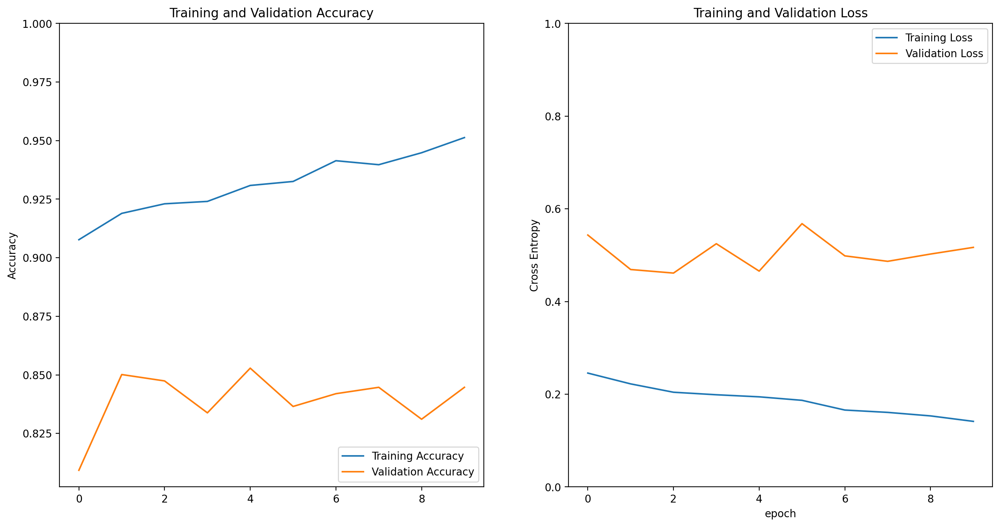

In [217]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [218]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 [==============================] - 0s 150ms/step


array([[2.35335538e-05, 1.08703229e-04, 9.89404202e-01, 1.38626565e-04,
        1.03249755e-02],
       [1.00000000e+00, 1.76258452e-09, 2.17877388e-16, 1.96064512e-14,
        2.75825939e-13],
       [2.00077623e-01, 6.27996624e-01, 6.08899584e-03, 1.54231369e-01,
        1.16053848e-02],
       [2.81263848e-08, 3.64870471e-06, 9.55538750e-01, 5.91053180e-08,
        4.44574282e-02],
       [5.25812745e-01, 4.71987814e-01, 4.49266168e-04, 1.36062794e-03,
        3.89642984e-04],
       [9.84945118e-01, 1.47148445e-02, 5.37620726e-05, 2.84998387e-04,
        1.28879708e-06],
       [1.21835978e-06, 2.51397658e-08, 9.99771774e-01, 2.56688531e-06,
        2.24435411e-04],
       [4.74301726e-03, 9.95241046e-01, 2.26764755e-07, 1.46055409e-05,
        1.01980561e-06],
       [7.22846323e-07, 8.66775540e-09, 3.30780866e-04, 9.99584138e-01,
        8.43194066e-05],
       [9.99999881e-01, 1.24113399e-07, 7.83128716e-14, 1.11918396e-12,
        2.81550038e-13],
       [9.47047412e-01, 5.2776

In [219]:
import numpy as np
from tensorflow.keras.metrics import Accuracy

# 정확도 계산을 위한 메트릭 생성
accuracy_metric = Accuracy()

# test_batches에서 모든 배치에 대해 반복
for image_batch, label_batch in test_batches:
    # 현재 배치에 대한 예측
    predictions = model.predict(image_batch)

    # 예측 결과를 클래스 레이블로 변환
    predicted_labels = np.argmax(predictions, axis=1)

    # 정확도 업데이트
    accuracy_metric.update_state(label_batch, predicted_labels)

# 최종 정확도 계산
accuracy = accuracy_metric.result().numpy()
print("Test accuracy: {:.2%}".format(accuracy))


1/1 [==============================] - 0s 233ms/step
Test accuracy: 85.29%


In [220]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([1, 2, 0, 1, 2, 3, 0, 3, 1, 3, 1, 4, 2, 0, 3])

1/1 [==============================] - 0s 25ms/step


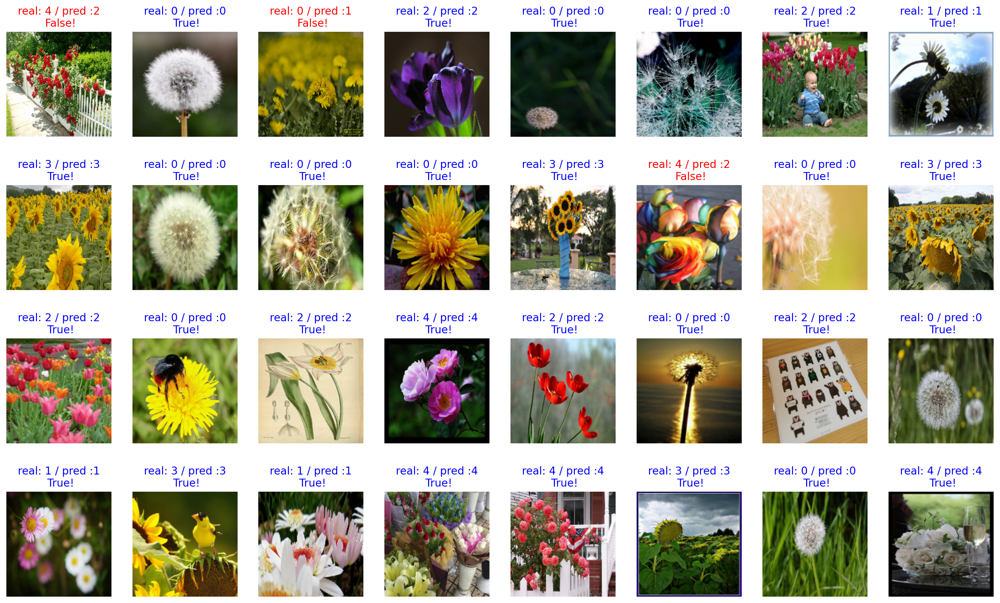

In [224]:
import matplotlib.pyplot as plt
import numpy as np

# 첫 번째 테스트 배치 데이터 가져오기
for image_batch, label_batch in test_batches.take(1):
    predictions = model.predict(image_batch)
    predicted_labels = np.argmax(predictions, axis=1)
    break  # 첫 번째 배치만 사용

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(image_batch, label_batch, predicted_labels)):
    plt.subplot(4, 8, idx+1)

    # 이미지 범위에 따라 조정 필요
    # 예: 이미지가 [-1, 1] 범위인 경우에만 아래 줄을 사용
    image = (image + 1) / 2

    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

plt.show()


In [230]:
# 정확도 계산
correct_count = 0
total_count = len(label_batch)

for label, prediction in zip(label_batch, predicted_labels):
    if label == prediction:
        correct_count += 1

accuracy = correct_count / total_count * 100
print(f"Accuracy: {accuracy}%")


Accuracy: 90.625%


# Step 5. 모델 성능 평가하기!

위의 모델을 통해 test 데이터에서의 정확도가 85.29%인 모델을 만들었다.

또한 test_batch에서의 정확도는 90.625%가 나왔다.

---

## 회고
모델의 성능을 올리기 위해 다양한 transfer learning을 시도했고 또한 하이퍼 파라미터를 다양하게 실험해 보며 더 나은 test 값이 나오도록 많은 시행착오를 거쳤다. 이를 통해 모델 데이터 셋에 따라 기존 학습된 모델도 선별 해서 가져오며 또한 regularization 기법도 활용하여 모델의 성능을 최적화 할수 있는 계기가 되었던거 같다.